In [2]:
!kaggle datasets list

ref                                                        title                                        size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------  ------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
themrityunjaypathak/covid-cases-and-deaths-worldwide       Covid Cases and Deaths WorldWide              8KB  2023-02-01 12:22:51           8817        285  1.0              
datascientistanna/customers-dataset                        Shop Customer Data                           23KB  2023-02-07 18:42:21           7189        170  1.0              
amaanansari09/top-100-songs                                Top 100 songs                                 6KB  2023-02-16 18:55:35           2157         72  1.0              
justin2028/unemployment-in-america-per-us-state            Unemployment in America, Per US State       826KB  2023-03-02 07:2

In [3]:
!kaggle datasets list -s flowers

ref                                     title                                  size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------  -----------------------------------  ------  -------------------  -------------  ---------  ---------------  
alxmamaev/flowers-recognition           Flowers Recognition                   225MB  2021-07-16 16:00:32          81805       1721  0.625            
l3llff/flowers                          🌸 | Flowers                           228MB  2022-04-29 20:37:05           2627         58  0.875            
imsparsh/flowers-dataset                Flowers Dataset                       205MB  2021-02-19 21:41:06           1876         28  0.9411765        
cdeotte/oxford-flowers-tfrecords        Oxford Flowers TFRecords                6GB  2020-03-12 16:20:14            163         45  0.625            
muhammedtausif/rose-flowers             Rose Flowers                          191MB  2022-04-03 17:3

In [4]:
# Download the dataset
!kaggle datasets download -d alxmamaev/flowers-recognition


  0%|          | 0.00/225M [00:00<?, ?B/s]
  0%|          | 1.00M/225M [00:00<03:33, 1.10MB/s]
  1%|          | 2.00M/225M [00:02<03:52, 1.00MB/s]
  1%|▏         | 3.00M/225M [00:03<03:59, 970kB/s] 
  2%|▏         | 4.00M/225M [00:04<03:55, 983kB/s]
  2%|▏         | 5.00M/225M [00:05<03:54, 981kB/s]
  3%|▎         | 6.00M/225M [00:06<03:54, 977kB/s]
  3%|▎         | 7.00M/225M [00:07<03:53, 977kB/s]
  4%|▎         | 8.00M/225M [00:08<03:54, 969kB/s]
  4%|▍         | 9.00M/225M [00:09<03:51, 978kB/s]
  4%|▍         | 10.0M/225M [00:10<03:50, 975kB/s]
  5%|▍         | 11.0M/225M [00:11<03:50, 973kB/s]
  5%|▌         | 12.0M/225M [00:12<03:49, 971kB/s]
  6%|▌         | 13.0M/225M [00:13<03:48, 972kB/s]
  6%|▌         | 14.0M/225M [00:15<03:46, 974kB/s]
  7%|▋         | 15.0M/225M [00:16<03:46, 972kB/s]
  7%|▋         | 16.0M/225M [00:17<03:45, 971kB/s]
  8%|▊         | 17.0M/225M [00:18<03:44, 972kB/s]
  8%|▊         | 18.0M/225M [00:19<03:42, 973kB/s]
  8%|▊         | 19.0M/225M [00:20<

In [5]:
# Unzip the dataset
!tar -xf flowers-recognition.zip

In [1]:
# Import modules
import os
from PIL import Image
import random
import matplotlib.pyplot as plt 
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from torchvision.io import read_image, ImageReadMode
import random
import numpy as np

c:\Users\Riccardo\miniconda3\envs\testCUDA\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Number of images of  daisy : 764
Number of images of  dandelion : 1052
Number of images of  rose : 784
Number of images of  sunflower : 733
Number of images of  tulip : 984


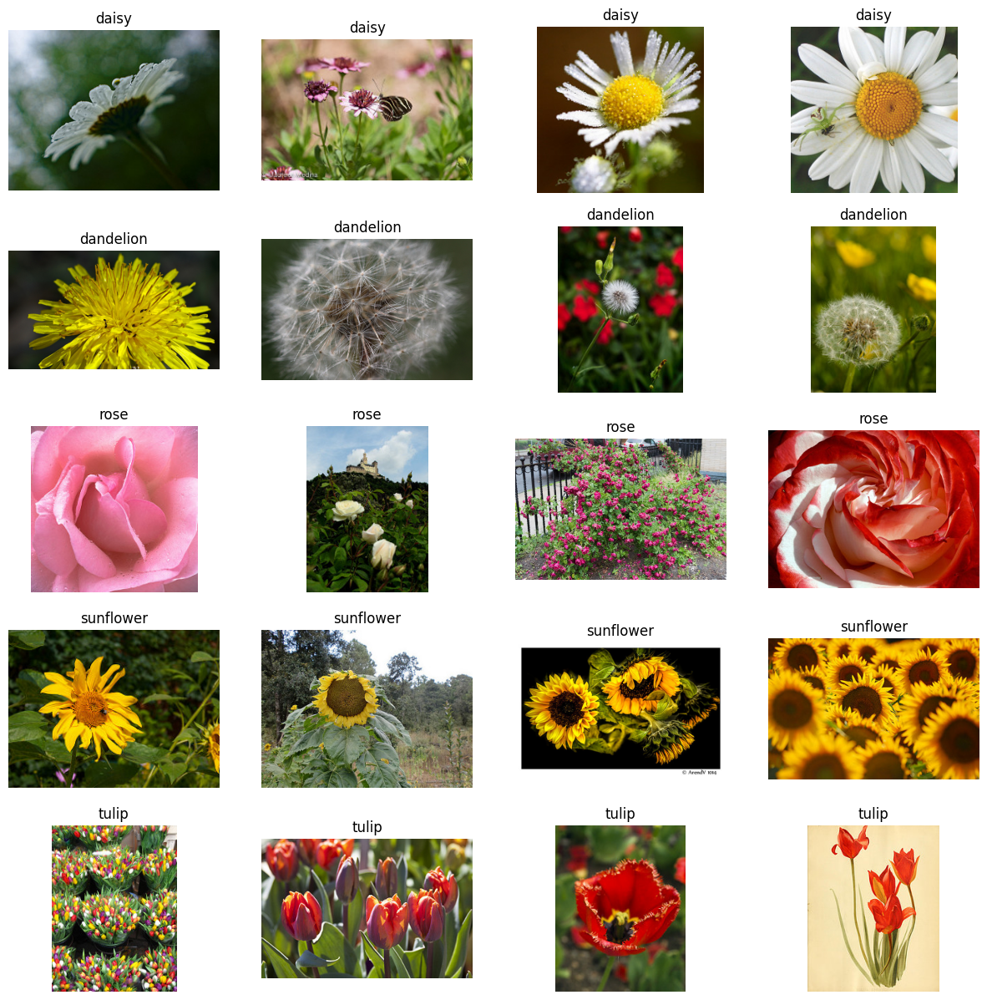

In [2]:
# Explore the data
fig = plt.figure(figsize=(15,15)) 
tot_images = 20
num_images_for_each = 4
for num_folder, folder in enumerate(os.listdir("flowers")):
    print("Number of images of ", folder,":",len(os.listdir("flowers/" + folder)))
    files = os.listdir("flowers/" + folder)
    random.shuffle(files)
    for num, fn in enumerate(files[:num_images_for_each]):
        path = os.path.join("flowers/" + folder,fn)
        img = Image.open(path)
        plt.subplot(tot_images//4,4,num_folder*4+num+1)
        plt.title(folder)
        plt.axis('off')
        plt.imshow(img)
plt.show()

Let's try our first attempt with the Plain-CNN that we defined last time! 

In [11]:
# This is the same architecture we implemented last time

class PlainBlock(nn.Module):
    '''
    Implements one block of the plain CNN network described in the paper "Deep residual learning for image recognition" by He et al. (2015)
    '''
    def __init__(self, in_ch, out_ch, kernel_size, num_layers, first_layer_stride=2, padding=1):
        super(PlainBlock, self).__init__()
        self.layers = []
        for i in range(num_layers):
            if(i==0):
                self.layers.append(nn.Conv2d(in_ch, out_ch, kernel_size, stride=first_layer_stride, bias=False, padding=padding))
            else:
                self.layers.append(nn.Conv2d(out_ch, out_ch, kernel_size, stride=1, bias=False, padding=padding))

            self.layers.append(nn.BatchNorm2d(out_ch))
            self.layers.append(nn.ReLU(inplace=True))
        
        self.layers = nn.Sequential(*self.layers)
    
    def forward(self, x):
        return self.layers(x)

class PlainCNN(nn.Module):
    def __init__(self, config, n_classes):
        super(PlainCNN, self).__init__()
        self.config = config

        self.pool = nn.MaxPool2d(2, 2)

        self.block1 = PlainBlock(3, 64, 7, config[0], first_layer_stride=2, padding=3)
        self.block2 = PlainBlock(64, 64, 3, config[1], first_layer_stride=1)
        self.block3 = PlainBlock(64, 128, 3, config[2], first_layer_stride=2)
        self.block4 = PlainBlock(128, 256, 3, config[3], first_layer_stride=2)
        self.block5 = PlainBlock(256, 512, 3, config[4], first_layer_stride=2)

        self.avg_pool = nn.AdaptiveAvgPool2d((1,1))
        self.fc = nn.Linear(512,n_classes)
    
    def forward(self, x):
        x = self.block1(x)
        x = self.pool(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.block5(x)

        x = self.avg_pool(x)
        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x

    def test_forward(self, x):
        '''
        This function is used to test the forward pass of the network. We can use it to check the shapes of the tensors at each layer.
        '''
        print(x.shape)
        x = self.block1(x)
        print(x.shape)
        x = self.pool(x)
        print(x.shape)
        x = self.block2(x)
        print(x.shape)
        x = self.block3(x)
        print(x.shape)
        x = self.block4(x)
        print(x.shape)
        x = self.block5(x)
        print(x.shape)
        x = self.avg_pool(x)
        print(x.shape)
        x = torch.flatten(x, start_dim=1)
        print(x.shape)
        x = self.fc(x)
        print(x.shape)

In [12]:
# Test the network 
net = PlainCNN([1,2,2,2,2], 5)
net.test_forward(torch.randn(1,3,224,224))

torch.Size([1, 3, 224, 224])
torch.Size([1, 64, 112, 112])
torch.Size([1, 64, 56, 56])
torch.Size([1, 64, 56, 56])
torch.Size([1, 128, 28, 28])
torch.Size([1, 256, 14, 14])
torch.Size([1, 512, 7, 7])
torch.Size([1, 512, 1, 1])
torch.Size([1, 512])
torch.Size([1, 5])


In [13]:
# Define the transformations that we want to apply in training and inference 

import torchvision.transforms as transf
from dataset import split_dataset

transforms_train = transf.Compose([transf.Resize((224,224)), 
                            transf.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
transforms_test_val = transf.Compose([transf.Resize((224,224)), 
                            transf.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

train_images, val_images, test_images = split_dataset("flowers", train_proportion=0.8, val_proportion=0.1)

Total number of images:  4317


In [14]:
from torch.optim import SGD
from torch.nn import CrossEntropyLoss
from tqdm import tqdm
from dataset import get_train_val_loaders, FlowerDataset

if __name__ == "__main__":

  trainset = FlowerDataset(train_images, transforms_train)
  valset = FlowerDataset(val_images, transforms_test_val)

  trainloader, valloader = get_train_val_loaders(trainset, valset, batch_size=8)

  # Use cuda if available
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  # Get the model 
  model = PlainCNN([1,4,4,4,4], n_classes=5)
  model.to(device)

  print("Tot model parameters:", sum([param.numel() for param in model.parameters()]))
  print("Trainable model parameters:", sum([param.numel() for param in model.parameters() if param.requires_grad]))

  # Hyperparameters 
  learning_rate = 5e-3
  epochs = 20

  # Get the optimizer
  optimizer = SGD(model.parameters(),lr=learning_rate, weight_decay=1e-4, momentum=0.9)

  # Get the loss function 
  loss_fn = CrossEntropyLoss(reduction="mean")

  # Start the training loop
  for epoch in range(epochs):
    loss_training = 0
    accuracy_training = 0 
    print("Epoch:", epoch)
    for i, data in enumerate(tqdm(trainloader)):
      imgs, labels = data
      # Send data to GPU
      imgs = imgs.to(device)
      labels = labels.to(device)
      predictions = model(imgs)
      loss = loss_fn(predictions,labels.view(-1))
      
      # Calculate the training accuracy 
      accuracy_training += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()

      # Zero the gradients in the optimizer
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_training += loss.item()
    
    # Test on validation images 
    loss_validation = 0
    accuracy_validation = 0
    with torch.no_grad():
      model.eval()
      for i, data in enumerate(tqdm(valloader)):
        imgs, labels = data
        # Send data to GPU
        imgs = imgs.to(device)
        labels = labels.to(device)
        
        predictions = model(imgs)
        loss = loss_fn(predictions,labels.view(-1))
        loss_validation += loss.item()
        accuracy_validation += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()
        
      # Put again model in training mode
      model.train()

    print("\nTraining loss epoch ",epoch,":",loss_training/len(trainloader))
    print("Training accuracy epoch ",epoch,":",accuracy_training/len(trainloader))
    print("Validation loss epoch ",epoch,":",loss_validation/len(valloader))
    print("Validation accuracy epoch ",epoch,":",accuracy_validation/len(valloader))

Tot model parameters: 11005253
Trainable model parameters: 11005253
Epoch: 0


100%|██████████| 43/43 [00:04<00:00, 10.17it/s]



Training loss epoch  0 : 1.5458885844998005
Training accuracy epoch  0 : 0.3321336761002063
Validation loss epoch  0 : 1.4423496154851692
Validation accuracy epoch  0 : 0.419435216243877
Epoch: 1


100%|██████████| 43/43 [00:03<00:00, 12.28it/s]



Training loss epoch  1 : 1.4053710987145
Training accuracy epoch  1 : 0.3838688946092037
Validation loss epoch  1 : 1.3737796822259591
Validation accuracy epoch  1 : 0.4563953488372093
Epoch: 2


100%|██████████| 43/43 [00:03<00:00, 12.24it/s]



Training loss epoch  2 : 1.2830263114220686
Training accuracy epoch  2 : 0.465488431884268
Validation loss epoch  2 : 1.291412494903387
Validation accuracy epoch  2 : 0.4617940215177314
Epoch: 3


100%|██████████| 43/43 [00:03<00:00, 12.26it/s]



Training loss epoch  3 : 1.2519472501884696
Training accuracy epoch  3 : 0.4938303342515215
Validation loss epoch  3 : 1.1500172899212948
Validation accuracy epoch  3 : 0.5519103005874989
Epoch: 4


100%|██████████| 43/43 [00:03<00:00, 11.00it/s]



Training loss epoch  4 : 1.1593232116539864
Training accuracy epoch  4 : 0.5375964010282777
Validation loss epoch  4 : 1.0481648805529573
Validation accuracy epoch  4 : 0.5959302325581395
Epoch: 5


100%|██████████| 43/43 [00:04<00:00,  9.47it/s]



Training loss epoch  5 : 1.1024682453634806
Training accuracy epoch  5 : 0.5705012853776887
Validation loss epoch  5 : 1.0828165370364522
Validation accuracy epoch  5 : 0.5701827244010083
Epoch: 6


100%|██████████| 43/43 [00:04<00:00,  9.37it/s]



Training loss epoch  6 : 1.0590365073215073
Training accuracy epoch  6 : 0.5897172236657081
Validation loss epoch  6 : 0.9819053418414537
Validation accuracy epoch  6 : 0.6009136216585026
Epoch: 7


100%|██████████| 43/43 [00:04<00:00,  9.36it/s]



Training loss epoch  7 : 1.0378999593631775
Training accuracy epoch  7 : 0.6111182519893107
Validation loss epoch  7 : 1.007917660266854
Validation accuracy epoch  7 : 0.6129568122154059
Epoch: 8


100%|██████████| 43/43 [00:06<00:00,  7.12it/s]



Training loss epoch  8 : 0.9786874971383641
Training accuracy epoch  8 : 0.629048843195322
Validation loss epoch  8 : 1.0098230845706408
Validation accuracy epoch  8 : 0.6013289052386617
Epoch: 9


100%|██████████| 43/43 [00:05<00:00,  7.54it/s]



Training loss epoch  9 : 0.9771799152108881
Training accuracy epoch  9 : 0.6273778920614934
Validation loss epoch  9 : 0.9197921579660371
Validation accuracy epoch  9 : 0.627491695936336
Epoch: 10


100%|██████████| 43/43 [00:04<00:00,  9.16it/s]



Training loss epoch  10 : 0.9699171334122018
Training accuracy epoch  10 : 0.6253213367609255
Validation loss epoch  10 : 0.9902203107296035
Validation accuracy epoch  10 : 0.6017441860465116
Epoch: 11


100%|██████████| 43/43 [00:03<00:00, 11.97it/s]



Training loss epoch  11 : 0.9386662035644208
Training accuracy epoch  11 : 0.6461439589301847
Validation loss epoch  11 : 1.0469399283445158
Validation accuracy epoch  11 : 0.588870432487754
Epoch: 12


100%|██████████| 43/43 [00:03<00:00, 11.09it/s]



Training loss epoch  12 : 0.8937076693711979
Training accuracy epoch  12 : 0.6716580977016978
Validation loss epoch  12 : 0.8971586074939993
Validation accuracy epoch  12 : 0.6387043193329213
Epoch: 13


100%|██████████| 43/43 [00:03<00:00, 10.81it/s]



Training loss epoch  13 : 0.8866838290329764
Training accuracy epoch  13 : 0.6743573264858104
Validation loss epoch  13 : 0.9002205121309258
Validation accuracy epoch  13 : 0.6511627906976745
Epoch: 14


100%|██████████| 43/43 [00:03<00:00, 11.87it/s]



Training loss epoch  14 : 0.8635564057256998
Training accuracy epoch  14 : 0.6771208226374305
Validation loss epoch  14 : 0.9145964760073396
Validation accuracy epoch  14 : 0.6449335564014523
Epoch: 15


100%|██████████| 43/43 [00:03<00:00, 11.66it/s]



Training loss epoch  15 : 0.8389795988721529
Training accuracy epoch  15 : 0.6851542416605667
Validation loss epoch  15 : 0.9840237690612327
Validation accuracy epoch  15 : 0.6420265796572663
Epoch: 16


100%|██████████| 43/43 [00:04<00:00,  8.88it/s]



Training loss epoch  16 : 0.8179645099339571
Training accuracy epoch  16 : 0.7086760925756322
Validation loss epoch  16 : 0.9011477313415949
Validation accuracy epoch  16 : 0.6121262464412424
Epoch: 17


100%|██████████| 43/43 [00:04<00:00,  9.35it/s]



Training loss epoch  17 : 0.8098638539985397
Training accuracy epoch  17 : 0.6961439588995396
Validation loss epoch  17 : 0.868893711719402
Validation accuracy epoch  17 : 0.6918604651162791
Epoch: 18


100%|██████████| 43/43 [00:04<00:00, 10.19it/s]



Training loss epoch  18 : 0.7976330540174077
Training accuracy epoch  18 : 0.7068123393392808
Validation loss epoch  18 : 0.9358027031601861
Validation accuracy epoch  18 : 0.6416112960771073
Epoch: 19


100%|██████████| 43/43 [00:04<00:00, 10.58it/s]


Training loss epoch  19 : 0.7650195411897257
Training accuracy epoch  19 : 0.7152313625291564
Validation loss epoch  19 : 0.955661800711654
Validation accuracy epoch  19 : 0.6395348837209303


In [15]:
# Save the weights of the network
torch.save(model.state_dict(), "weights/weights_plain_18.pth")

In [16]:
# Load the weights of the network 
model = PlainCNN([1,4,4,4,4], n_classes=5)
model.load_state_dict(torch.load("weights/weights_plain_18.pth"))

<All keys matched successfully>

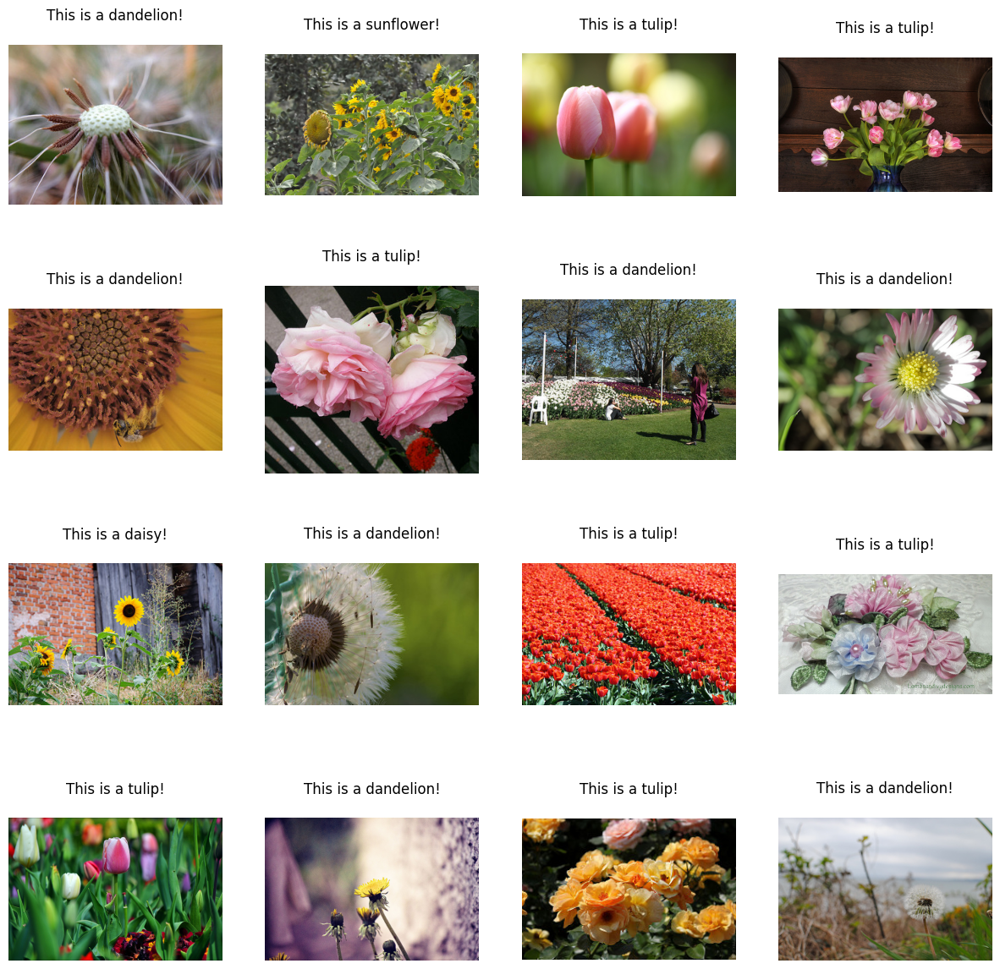

In [17]:
# Let's try to predict some test images and the predictions

from dataset import FlowerDataset
from dataset import get_test_loader

fig = plt.figure(figsize=(15,15))
num_images = 16
testset = FlowerDataset(test_images, None)
testloader = get_test_loader(testset, batch_size=1)
testloader = iter(testloader)

model.eval()
with torch.no_grad():
  for i in range(num_images):
    image, label = next(testloader)
    # Apply transformation on image
    image_transf = transforms_test_val(image)
    out = model(image_transf)
    prediction = out.argmax(1)
    plt.subplot(num_images//4,4,i+1)
    plt.axis('off')
    plt.imshow(image.squeeze().moveaxis(0,-1))
    if(prediction.item()==0):
      plt.title("This is a daisy!\n")
    elif (prediction.item()==1):
      plt.title("This is a dandelion!\n")
    elif (prediction.item()==2):
      plt.title("This is a rose!\n")
    elif (prediction.item()==3):
      plt.title("This is a sunflower!\n")
    elif(prediction.item()==4):
      plt.title("This is a tulip!\n")

plt.show()

In [22]:
# Let's calculate the accuracy on the test set 
testset = FlowerDataset(test_images, transforms_test_val)
testloader = get_test_loader(testset, batch_size=8)
loss_fn = CrossEntropyLoss(reduction="mean")
# Put the model in evaluation mode
model.eval()
# Send the model to the device
model.to(device)
with torch.no_grad():
    loss_test = 0 
    accuracy_test = 0
    for i, data in enumerate(tqdm(testloader)):
        imgs, labels = data 
        # Send data to device
        imgs = imgs.to(device)
        labels = labels.to(device)
        # Predict
        predictions = model(imgs)
        loss = loss_fn(predictions,labels)
        loss_test += loss.item()
        accuracy_test += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()
        
print("\nTest loss:",loss_test/len(testloader))
print("Test accuracy:",accuracy_test/len(testloader))

100%|██████████| 109/109 [00:12<00:00,  8.74it/s]


Test loss: 0.8777836465507473
Test accuracy: 0.6708715596330275


Do it with a residual connections network!

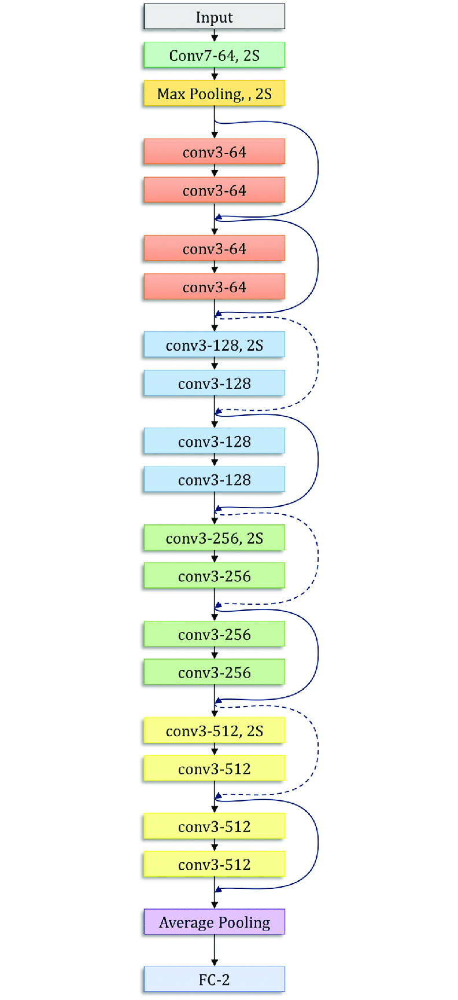

In [23]:
class SkipLayer(nn.Module):
    '''
    Implements a single skip connection sub-block of the residual CNN. It consists of two convolutional layers with batch normalization and ReLU activation.
    '''
    def __init__(self, in_ch, out_ch, kernel_size, stride_first_conv=1):
        super(SkipLayer, self).__init__()
        layers = []
        self.stride_first_conv = stride_first_conv
        if(stride_first_conv!=1):
            self.conv1x1 = nn.Conv2d(in_ch, in_ch*2, 1, stride=stride_first_conv, bias=False)
            self.bn = nn.BatchNorm2d(in_ch*2)
        # Append first convolutional layer
        layers.append(nn.Conv2d(in_ch, out_ch, kernel_size, stride=stride_first_conv, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(out_ch))
        layers.append(nn.ReLU(inplace=True))
        # Append second convolutional layer
        layers.append(nn.Conv2d(out_ch, out_ch, kernel_size, stride=1, padding=1, bias=False))
        layers.append(nn.BatchNorm2d(out_ch))
        self.layers = nn.Sequential(*layers)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        identity = x 
        out = self.layers(x)

        if self.stride_first_conv!=1:
            # Project the identity to match the correct dimension
            identity = self.bn(self.conv1x1(identity))

        return self.relu(out + identity)

class SkipBlock(nn.Module):
    '''
    Implements one block of the residual CNN described in the paper "Deep residual learning for image recognition" by He et al. (2015)
    Here block refers to the different coloured parts of the network in the figure of the paper.
    '''
    def __init__(self, in_ch, out_ch, kernel_size, num_layers, first_layer_stride=2):
        super(SkipBlock, self).__init__()
        layers = []

        # Append the skip connections
        for i in range(num_layers):
            if i == 0:
                layers.append(SkipLayer(in_ch, out_ch, kernel_size, stride_first_conv=first_layer_stride))
            else:
                layers.append(SkipLayer(out_ch, out_ch, kernel_size, stride_first_conv=1))
        
        self.layers = nn.Sequential(*layers)

    
    def forward(self, x):
        return self.layers(x)

class SkipCNN(nn.Module):
    def __init__(self, config, n_classes=5):
        super(SkipCNN, self).__init__()
        self.config = config

        self.pool = nn.MaxPool2d(2, 2)
        self.block1 = PlainBlock(3, 64, 7, config[0], first_layer_stride=2, padding=3)
        self.block2 = SkipBlock(64, 64, 3, config[1], first_layer_stride=1)
        self.block3 = SkipBlock(64, 128, 3, config[2], first_layer_stride=2)
        self.block4 = SkipBlock(128, 256, 3, config[3], first_layer_stride=2)
        self.block5 = SkipBlock(256, 512, 3, config[4], first_layer_stride=2)

        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512, n_classes)

    
    def forward(self, x):
        x = self.block1(x)
        x = self.pool(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.block5(x)

        x = self.avg_pool(x)
        x = torch.flatten(x, start_dim=1)
        x = self.fc(x)
        return x
    
    def test_forward(self, x):
        x = self.block1(x)
        print("First block")
        print(x.shape)
        x = self.pool(x)
        print("Pool")
        print(x.shape)
        x = self.block2(x)
        print("Second block")
        print(x.shape)
        x = self.block3(x)
        print("Third block")
        print(x.shape)
        x = self.block4(x)
        print("Fourth block")
        print(x.shape)
        x = self.block5(x)
        print("Fifth block")
        print(x.shape)
        x = self.avg_pool(x)
        print(x.shape)
        x = torch.flatten(x, start_dim=1)
        print(x.shape)
        x = self.fc(x)
        print(x.shape)

In [25]:
# Let's see if the number of parameters is the same as the resnet18 from pytorch!

from torchvision.models import resnet18

network1 = resnet18()
network1.fc = nn.Linear(512,5)

print("Parameters of the ResNet18 model:", sum([param.numel() for param in network1.parameters()]))

network = SkipCNN([1,2,2,2,2])

print("Parameters of the SkipCNN model:", sum([param.numel() for param in network.parameters()]))

del network1
del network

Parameters of the ResNet18 model: 11179077
Parameters of the SkipCNN model: 11179077


In [13]:
from torch.optim import SGD
from torch.nn import CrossEntropyLoss
from tqdm import tqdm
from dataset import get_train_val_loaders, FlowerDataset

if __name__ == "__main__":

  trainset = FlowerDataset(train_images, transforms_train)
  valset = FlowerDataset(val_images, transforms_test_val)

  trainloader, valloader = get_train_val_loaders(trainset, valset, batch_size=8)

  # Use cuda if available
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  # Get the model 
  model = SkipCNN([1,2,2,2,2], n_classes=5)
  model.to(device)

  print("Tot model parameters:", sum([param.numel() for param in model.parameters()]))

  # Hyperparameters 
  learning_rate = 5e-3
  epochs = 20

  # Get the optimizer
  optimizer = SGD(model.parameters(),lr=learning_rate, weight_decay=1e-4, momentum=0.9)

  # Get the loss function 
  loss_fn = CrossEntropyLoss(reduction="mean")

  # Start the training loop
  for epoch in range(epochs):
    loss_training = 0
    accuracy_training = 0 
    print("Epoch:", epoch)
    for i, data in enumerate(tqdm(trainloader)):
      imgs, labels = data
      # Send data to GPU
      imgs = imgs.to(device)
      labels = labels.to(device)
      predictions = model(imgs)
      loss = loss_fn(predictions,labels.view(-1))
      
      # Calculate the training accuracy 
      accuracy_training += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()

      # Zero the gradients in the optimizer
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_training += loss.item()
    
    # Test on validation images 
    loss_validation = 0
    accuracy_validation = 0
    with torch.no_grad():
      model.eval()
      for i, data in enumerate(tqdm(valloader)):
        imgs, labels = data
        # Send data to GPU
        imgs = imgs.to(device)
        labels = labels.to(device)
        
        predictions = model(imgs)
        loss = loss_fn(predictions,labels.view(-1))
        loss_validation += loss.item()
        accuracy_validation += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()
        
      # Put again model in training mode
      model.train()

    print("\nTraining loss epoch ",epoch,":",loss_training/len(trainloader))
    print("Training accuracy epoch ",epoch,":",accuracy_training/len(trainloader))
    print("Validation loss epoch ",epoch,":",loss_validation/len(valloader))
    print("Validation accuracy epoch ",epoch,":",accuracy_validation/len(valloader))

Tot model parameters: 11179077
Epoch: 0


100%|██████████| 43/43 [00:04<00:00, 10.40it/s]



Training loss epoch  0 : 1.540019906425231
Training accuracy epoch  0 : 0.38071979440576315
Validation loss epoch  0 : 2.1871611430894498
Validation accuracy epoch  0 : 0.4144518278365911
Epoch: 1


100%|██████████| 43/43 [00:04<00:00,  9.98it/s]



Training loss epoch  1 : 1.3103764559738433
Training accuracy epoch  1 : 0.47982005142920425
Validation loss epoch  1 : 1.7447336239870204
Validation accuracy epoch  1 : 0.3799833891003631
Epoch: 2


100%|██████████| 43/43 [00:05<00:00,  8.29it/s]



Training loss epoch  2 : 1.178929164201251
Training accuracy epoch  2 : 0.5284061696964548
Validation loss epoch  2 : 1.4718758728961612
Validation accuracy epoch  2 : 0.554817277331685
Epoch: 3


100%|██████████| 43/43 [00:04<00:00, 10.69it/s]



Training loss epoch  3 : 1.1088289073776156
Training accuracy epoch  3 : 0.5595758355062235
Validation loss epoch  3 : 2.5115220754645593
Validation accuracy epoch  3 : 0.46553156161031056
Epoch: 4


100%|██████████| 43/43 [00:04<00:00,  9.85it/s]



Training loss epoch  4 : 1.0670058464483
Training accuracy epoch  4 : 0.590359897187559
Validation loss epoch  4 : 1.115302590090175
Validation accuracy epoch  4 : 0.563953488372093
Epoch: 5


100%|██████████| 43/43 [00:05<00:00,  8.20it/s]



Training loss epoch  5 : 0.9997156224091439
Training accuracy epoch  5 : 0.6182519280205655
Validation loss epoch  5 : 1.024206712495449
Validation accuracy epoch  5 : 0.6137873755637989
Epoch: 6


100%|██████████| 43/43 [00:04<00:00, 10.53it/s]



Training loss epoch  6 : 0.9758114576492947
Training accuracy epoch  6 : 0.6275706940874036
Validation loss epoch  6 : 0.9311263954570127
Validation accuracy epoch  6 : 0.6524086386658424
Epoch: 7


100%|██████████| 43/43 [00:03<00:00, 10.91it/s]



Training loss epoch  7 : 0.9014989552507058
Training accuracy epoch  7 : 0.6625964010282777
Validation loss epoch  7 : 1.2352561635333439
Validation accuracy epoch  7 : 0.6391196029130802
Epoch: 8


100%|██████████| 43/43 [00:04<00:00, 10.60it/s]



Training loss epoch  8 : 0.8237311165866018
Training accuracy epoch  8 : 0.6900385604419561
Validation loss epoch  8 : 0.949592670728994
Validation accuracy epoch  8 : 0.6486710964940315
Epoch: 9


100%|██████████| 43/43 [00:04<00:00,  9.95it/s]



Training loss epoch  9 : 0.7990643834087107
Training accuracy epoch  9 : 0.7008354755784062
Validation loss epoch  9 : 1.0236551640338676
Validation accuracy epoch  9 : 0.6353820603947307
Epoch: 10


100%|██████████| 43/43 [00:04<00:00,  9.84it/s]



Training loss epoch  10 : 0.7547536907205239
Training accuracy epoch  10 : 0.7250642673828301
Validation loss epoch  10 : 1.1884480737322984
Validation accuracy epoch  10 : 0.6063122929528703
Epoch: 11


100%|██████████| 43/43 [00:04<00:00,  9.56it/s]



Training loss epoch  11 : 0.706854671603763
Training accuracy epoch  11 : 0.7300128535317272
Validation loss epoch  11 : 0.8323315718146258
Validation accuracy epoch  11 : 0.6590531565422235
Epoch: 12


100%|██████████| 43/43 [00:04<00:00, 10.30it/s]



Training loss epoch  12 : 0.6376171565032863
Training accuracy epoch  12 : 0.7620179948892569
Validation loss epoch  12 : 0.8889131073861621
Validation accuracy epoch  12 : 0.6997508309608282
Epoch: 13


100%|██████████| 43/43 [00:03<00:00, 11.55it/s]



Training loss epoch  13 : 0.5820357527746639
Training accuracy epoch  13 : 0.792030848390339
Validation loss epoch  13 : 0.95473501476091
Validation accuracy epoch  13 : 0.6993355487668237
Epoch: 14


100%|██████████| 43/43 [00:04<00:00, 10.50it/s]



Training loss epoch  14 : 0.5425559123427365
Training accuracy epoch  14 : 0.8018637532440127
Validation loss epoch  14 : 1.1123964673038138
Validation accuracy epoch  14 : 0.6972591377968012
Epoch: 15


100%|██████████| 43/43 [00:03<00:00, 10.97it/s]



Training loss epoch  15 : 0.5038941350111925
Training accuracy epoch  15 : 0.8174807197943444
Validation loss epoch  15 : 1.2007905033871877
Validation accuracy epoch  15 : 0.6694352162438769
Epoch: 16


100%|██████████| 43/43 [00:04<00:00, 10.35it/s]



Training loss epoch  16 : 0.42930021696271503
Training accuracy epoch  16 : 0.843508997429306
Validation loss epoch  16 : 1.4057334944779096
Validation accuracy epoch  16 : 0.6640365456425866
Epoch: 17


100%|██████████| 43/43 [00:04<00:00, 10.54it/s]



Training loss epoch  17 : 0.38593820239247273
Training accuracy epoch  17 : 0.8564910026013391
Validation loss epoch  17 : 1.0563799063133639
Validation accuracy epoch  17 : 0.6644518278365912
Epoch: 18


100%|██████████| 43/43 [00:05<00:00,  8.52it/s]



Training loss epoch  18 : 0.31006318964973895
Training accuracy epoch  18 : 0.8926735218508998
Validation loss epoch  18 : 1.267429927927117
Validation accuracy epoch  18 : 0.6225083057963571
Epoch: 19


100%|██████████| 43/43 [00:04<00:00, 10.57it/s]


Training loss epoch  19 : 0.25647784662995593
Training accuracy epoch  19 : 0.9090616966580977
Validation loss epoch  19 : 1.146031717878095
Validation accuracy epoch  19 : 0.6760797348133353


In [14]:
# Save the weights of the network
torch.save(model.state_dict(), "weights/weights_skip_18.pth")

In [15]:
# Load the weights of the network 
model = SkipCNN([1,2,2,2,2], n_classes=5)
model.load_state_dict(torch.load("weights/weights_skip_18.pth"))

<All keys matched successfully>

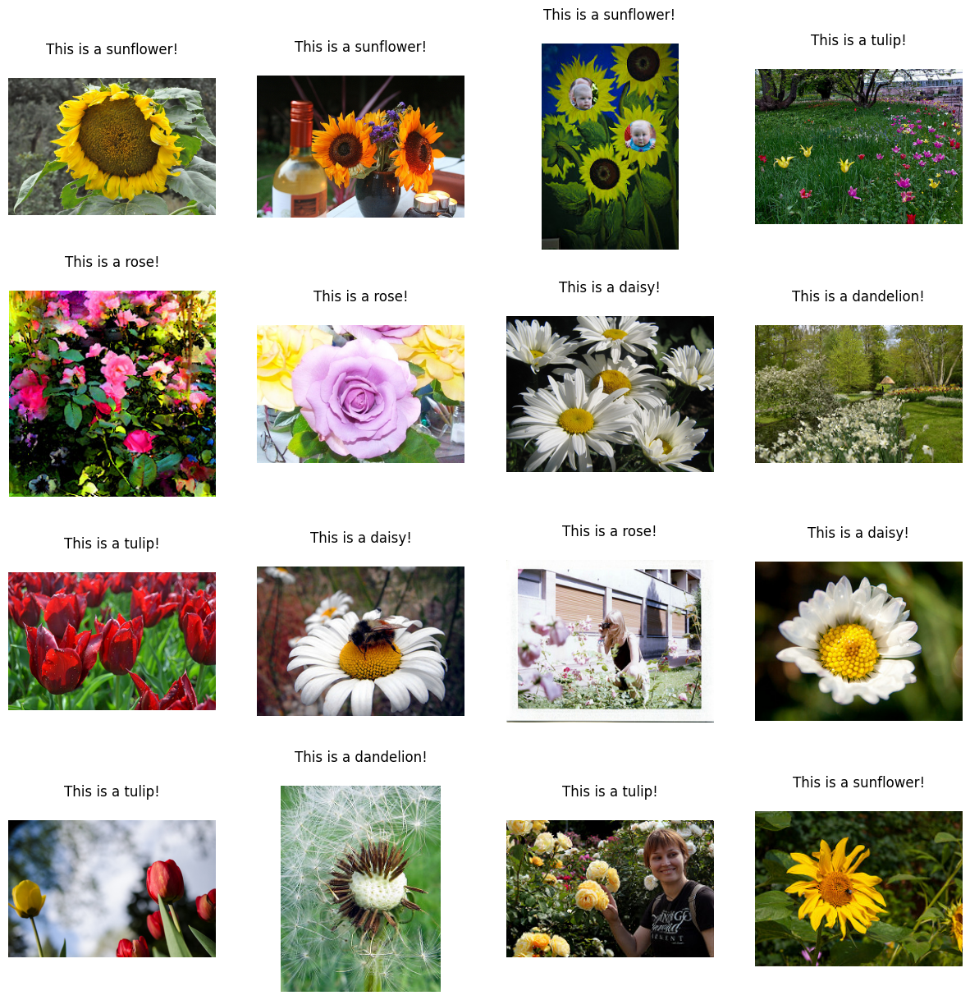

In [16]:
# Explore the data 
from dataset import FlowerDataset
from dataset import get_test_loader

fig = plt.figure(figsize=(15,15))
num_images = 16
testset = FlowerDataset(test_images, None)
testloader = get_test_loader(testset, batch_size=1)
testloader = iter(testloader)

model.eval()
with torch.no_grad():
  for i in range(num_images):
    image, label = next(testloader)
    # Apply transformation on image
    image_transf = transforms_test_val(image)
    out = model(image_transf)
    prediction = out.argmax(1)
    plt.subplot(num_images//4,4,i+1)
    plt.axis('off')
    plt.imshow(image.squeeze().moveaxis(0,-1))
    if(prediction.item()==0):
      plt.title("This is a daisy!\n")
    elif (prediction.item()==1):
      plt.title("This is a dandelion!\n")
    elif (prediction.item()==2):
      plt.title("This is a rose!\n")
    elif (prediction.item()==3):
      plt.title("This is a sunflower!\n")
    elif(prediction.item()==4):
      plt.title("This is a tulip!\n")

plt.show()

# Do it with transfer learning 

In [19]:
# Build datasets, dataloader
import torchvision.transforms as transf

transforms_train = transf.Compose([
                            transf.Resize((224,224)),
                            transf.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
transforms_test_val = transf.Compose([
                            transf.Resize((224,224)),
                            transf.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

In [22]:
from torch.optim import SGD
from torch.nn import CrossEntropyLoss
from tqdm import tqdm
from dataset import get_train_val_loaders, FlowerDataset
from torchvision.models import resnet18, ResNet18_Weights

if __name__ == "__main__":

  trainset = FlowerDataset(train_images, transforms_train)
  valset = FlowerDataset(val_images, transforms_test_val)

  trainloader, valloader = get_train_val_loaders(trainset, valset, batch_size=8)

  # Use cuda if available
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  # Get the model 
  model = resnet18(weights=ResNet18_Weights.DEFAULT)
  # Modify the last classification layer 
  model.fc = nn.Linear(512,5)
  # Freeze all except the last layer
  for name, param in model.named_parameters():
    if "fc" not in name:
      param.requires_grad = False
    
  model.to(device)

  print("Tot model parameters:", sum([param.numel() for param in model.parameters()]))
  print("Trainable parameters:", sum([param.numel() for param in model.parameters() if param.requires_grad]))

  # Hyperparameters 
  learning_rate = 1e-3
  epochs = 10

  # Get the optimizer
  optimizer = SGD(model.parameters(),lr=learning_rate, weight_decay=1e-6, momentum=0.9)

  # Get the loss function 
  loss_fn = CrossEntropyLoss(reduction="mean")

  # Start the training loop
  for epoch in range(epochs):
    loss_training = 0
    accuracy_training = 0 
    print("Epoch:", epoch)
    for i, data in enumerate(tqdm(trainloader)):
      imgs, labels = data
      # Send data to GPU
      imgs = imgs.to(device)
      labels = labels.to(device)
      predictions = model(imgs)
      loss = loss_fn(predictions,labels.view(-1))
      
      # Calculate the training accuracy 
      accuracy_training += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()

      # Zero the gradients in the optimizer
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_training += loss.item()
    
    # Test on validation images 
    loss_validation = 0
    accuracy_validation = 0
    with torch.no_grad():
      model.eval()
      for i, data in enumerate(tqdm(valloader)):
        imgs, labels = data
        # Send data to GPU
        imgs = imgs.to(device)
        labels = labels.to(device)
        
        predictions = model(imgs)
        loss = loss_fn(predictions,labels.view(-1))
        loss_validation += loss.item()
        accuracy_validation += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()
        
      # Put again model in training mode
      model.train()

    print("\nTraining loss epoch ",epoch,":",loss_training/len(trainloader))
    print("Training accuracy epoch ",epoch,":",accuracy_training/len(trainloader))
    print("Validation loss epoch ",epoch,":",loss_validation/len(valloader))
    print("Validation accuracy epoch ",epoch,":",accuracy_validation/len(valloader))

Tot model parameters: 11179077
Trainable parameters: 2565
Epoch: 0


100%|██████████| 43/43 [00:03<00:00, 13.45it/s]



Training loss epoch  0 : 0.7938789059922751
Training accuracy epoch  0 : 0.7009640103134214
Validation loss epoch  0 : 0.4902612448691629
Validation accuracy epoch  0 : 0.8280730912851733
Epoch: 1


100%|██████████| 43/43 [00:03<00:00, 11.47it/s]



Training loss epoch  1 : 0.5953697334965428
Training accuracy epoch  1 : 0.7844473007865308
Validation loss epoch  1 : 0.4141824193905259
Validation accuracy epoch  1 : 0.8401162790697675
Epoch: 2


100%|██████████| 43/43 [00:04<00:00, 10.51it/s]



Training loss epoch  2 : 0.5033841577949898
Training accuracy epoch  2 : 0.8224293059432415
Validation loss epoch  2 : 0.35685911389111086
Validation accuracy epoch  2 : 0.877906976744186
Epoch: 3


100%|██████████| 43/43 [00:04<00:00,  8.62it/s]



Training loss epoch  3 : 0.46535069430318776
Training accuracy epoch  3 : 0.8366966581589765
Validation loss epoch  3 : 0.38782056234776974
Validation accuracy epoch  3 : 0.8604651162790697
Epoch: 4


100%|██████████| 43/43 [00:05<00:00,  7.87it/s]



Training loss epoch  4 : 0.4436359056355408
Training accuracy epoch  4 : 0.8391388175113649
Validation loss epoch  4 : 0.38433076605893846
Validation accuracy epoch  4 : 0.8546511627906976
Epoch: 5


100%|██████████| 43/43 [00:05<00:00,  8.08it/s]



Training loss epoch  5 : 0.459703403599273
Training accuracy epoch  5 : 0.8372107969458121
Validation loss epoch  5 : 0.37171674334595717
Validation accuracy epoch  5 : 0.8604651162790697
Epoch: 6


100%|██████████| 43/43 [00:05<00:00,  8.08it/s]



Training loss epoch  6 : 0.43902625504325704
Training accuracy epoch  6 : 0.8358611825346027
Validation loss epoch  6 : 0.37810158217325807
Validation accuracy epoch  6 : 0.8604651162790697
Epoch: 7


100%|██████████| 43/43 [00:05<00:00,  8.21it/s]



Training loss epoch  7 : 0.42301902503546107
Training accuracy epoch  7 : 0.8406169665809768
Validation loss epoch  7 : 0.3771330615462259
Validation accuracy epoch  7 : 0.8633720930232558
Epoch: 8


100%|██████████| 43/43 [00:05<00:00,  8.26it/s]



Training loss epoch  8 : 0.4206625767947584
Training accuracy epoch  8 : 0.849228791835069
Validation loss epoch  8 : 0.3706996514310324
Validation accuracy epoch  8 : 0.8691860465116279
Epoch: 9


100%|██████████| 43/43 [00:05<00:00,  8.12it/s]


Training loss epoch  9 : 0.41553294300855853
Training accuracy epoch  9 : 0.8553341902926526
Validation loss epoch  9 : 0.4016515358329512
Validation accuracy epoch  9 : 0.8517441860465116


In [23]:
# Save the weights of the network
torch.save(model.state_dict(), "weights/weights_resnet_18_linear_probing.pth")

In [27]:
# Load the weights of the network 
model = resnet18()
model.fc = nn.Linear(512,5)
model.load_state_dict(torch.load("weights/weights_resnet_18_linear_probing.pth"))

<All keys matched successfully>

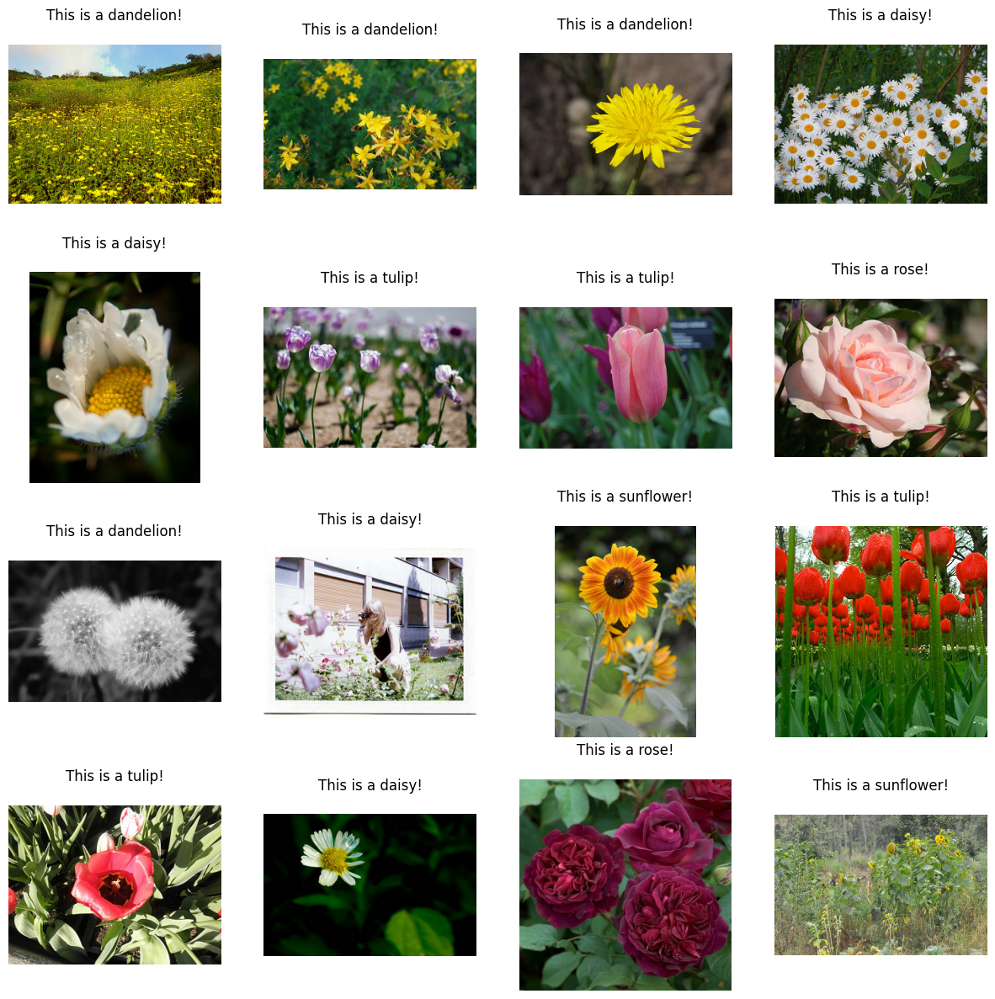

In [29]:
# Explore the data 
from dataset import FlowerDataset
from dataset import get_test_loader

fig = plt.figure(figsize=(15,15))
num_images = 16
testset = FlowerDataset(test_images, None)
testloader = get_test_loader(testset, batch_size=1)
testloader = iter(testloader)

model.eval()
with torch.no_grad():
  for i in range(num_images):
    image, label = next(testloader)
    # Apply transformation on image
    image_transf = transforms_test_val(image)
    out = model(image_transf)
    prediction = out.argmax(1)
    plt.subplot(num_images//4,4,i+1)
    plt.axis('off')
    plt.imshow(image.squeeze().moveaxis(0,-1))
    if(prediction.item()==0):
      plt.title("This is a daisy!\n")
    elif (prediction.item()==1):
      plt.title("This is a dandelion!\n")
    elif (prediction.item()==2):
      plt.title("This is a rose!\n")
    elif (prediction.item()==3):
      plt.title("This is a sunflower!\n")
    elif(prediction.item()==4):
      plt.title("This is a tulip!\n")

plt.show()

In [31]:
from torch.optim import SGD
from torch.nn import CrossEntropyLoss
from tqdm import tqdm
from dataset import get_train_val_loaders, FlowerDataset
from torchvision.models import resnet50, ResNet50_Weights

if __name__ == "__main__":

  trainset = FlowerDataset(train_images, transforms_train)
  valset = FlowerDataset(val_images, transforms_test_val)

  trainloader, valloader = get_train_val_loaders(trainset, valset, batch_size=8)

  # Use cuda if available
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  # Get the model 
  model = resnet50(weights=ResNet50_Weights.DEFAULT)
  # Modify the last classification layer 
  model.fc = nn.Linear(2048,5)
  # Freeze all except the last layer
  for name, param in model.named_parameters():
    if "fc" not in name:
      param.requires_grad = False
    
  model.to(device)

  print("Tot model parameters:", sum([param.numel() for param in model.parameters()]))
  print("Trainable parameters:", sum([param.numel() for param in model.parameters() if param.requires_grad]))

  # Hyperparameters 
  learning_rate = 1e-3
  epochs = 10

  # Get the optimizer
  optimizer = SGD(model.parameters(),lr=learning_rate, weight_decay=1e-6, momentum=0.9)

  # Get the loss function 
  loss_fn = CrossEntropyLoss(reduction="mean")

  # Start the training loop
  for epoch in range(epochs):
    loss_training = 0
    accuracy_training = 0 
    print("Epoch:", epoch)
    for i, data in enumerate(tqdm(trainloader)):
      imgs, labels = data
      # Send data to GPU
      imgs = imgs.to(device)
      labels = labels.to(device)
      predictions = model(imgs)
      loss = loss_fn(predictions,labels.view(-1))
      
      # Calculate the training accuracy 
      accuracy_training += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()

      # Zero the gradients in the optimizer
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_training += loss.item()
    
    # Test on validation images 
    loss_validation = 0
    accuracy_validation = 0
    with torch.no_grad():
      model.eval()
      for i, data in enumerate(tqdm(valloader)):
        imgs, labels = data
        # Send data to GPU
        imgs = imgs.to(device)
        labels = labels.to(device)
        
        predictions = model(imgs)
        loss = loss_fn(predictions,labels.view(-1))
        loss_validation += loss.item()
        accuracy_validation += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()
        
      # Put again model in training mode
      model.train()

    print("\nTraining loss epoch ",epoch,":",loss_training/len(trainloader))
    print("Training accuracy epoch ",epoch,":",accuracy_training/len(trainloader))
    print("Validation loss epoch ",epoch,":",loss_validation/len(valloader))
    print("Validation accuracy epoch ",epoch,":",accuracy_validation/len(valloader))

Tot model parameters: 23518277
Trainable parameters: 10245
Epoch: 0


100%|██████████| 43/43 [00:07<00:00,  5.56it/s]



Training loss epoch  0 : 1.0132828905680493
Training accuracy epoch  0 : 0.7076478149253482
Validation loss epoch  0 : 0.6508988453898319
Validation accuracy epoch  0 : 0.8542358819828477
Epoch: 1


100%|██████████| 43/43 [00:07<00:00,  5.77it/s]



Training loss epoch  1 : 0.6443913090964516
Training accuracy epoch  1 : 0.8243573265087941
Validation loss epoch  1 : 0.5002059820432996
Validation accuracy epoch  1 : 0.8808139534883721
Epoch: 2


100%|██████████| 43/43 [00:07<00:00,  5.43it/s]



Training loss epoch  2 : 0.5480791820275447
Training accuracy epoch  2 : 0.8467223650385605
Validation loss epoch  2 : 0.4086403493271318
Validation accuracy epoch  2 : 0.8895348837209303
Epoch: 3


100%|██████████| 43/43 [00:08<00:00,  5.30it/s]



Training loss epoch  3 : 0.5003719182737689
Training accuracy epoch  3 : 0.8483290488431876
Validation loss epoch  3 : 0.39706928560207055
Validation accuracy epoch  3 : 0.8862126261688942
Epoch: 4


100%|██████████| 43/43 [00:08<00:00,  5.13it/s]



Training loss epoch  4 : 0.45613662706051206
Training accuracy epoch  4 : 0.8625964010589227
Validation loss epoch  4 : 0.3694410236595675
Validation accuracy epoch  4 : 0.9007475098898244
Epoch: 5


100%|██████████| 43/43 [00:08<00:00,  5.25it/s]



Training loss epoch  5 : 0.4287899329990225
Training accuracy epoch  5 : 0.8672879177377892
Validation loss epoch  5 : 0.34432326690402143
Validation accuracy epoch  5 : 0.9007475098898244
Epoch: 6


100%|██████████| 43/43 [00:08<00:00,  4.89it/s]



Training loss epoch  6 : 0.41713515187405376
Training accuracy epoch  6 : 0.8800771208839122
Validation loss epoch  6 : 0.3526835715354875
Validation accuracy epoch  6 : 0.8949335564014523
Epoch: 7


100%|██████████| 43/43 [00:08<00:00,  5.20it/s]



Training loss epoch  7 : 0.38691015746492347
Training accuracy epoch  7 : 0.8852827763496144
Validation loss epoch  7 : 0.3144841616063617
Validation accuracy epoch  7 : 0.9123754168665686
Epoch: 8


100%|██████████| 43/43 [00:07<00:00,  5.44it/s]



Training loss epoch  8 : 0.38802332118881394
Training accuracy epoch  8 : 0.8741645244522389
Validation loss epoch  8 : 0.31441765651106834
Validation accuracy epoch  8 : 0.9181893703549407
Epoch: 9


100%|██████████| 43/43 [00:08<00:00,  5.23it/s]


Training loss epoch  9 : 0.3728672839787365
Training accuracy epoch  9 : 0.8854113110846297
Validation loss epoch  9 : 0.32738065936191135
Validation accuracy epoch  9 : 0.9007475098898244


In [32]:
# Save the weights of the network
torch.save(model.state_dict(), "weights/weights_resnet_50_linear_probing.pth")

In [33]:
# Load the weights of the network 
model = resnet50()
model.fc = nn.Linear(2048,5)
model.load_state_dict(torch.load("weights/weights_resnet_50_linear_probing.pth"))

<All keys matched successfully>

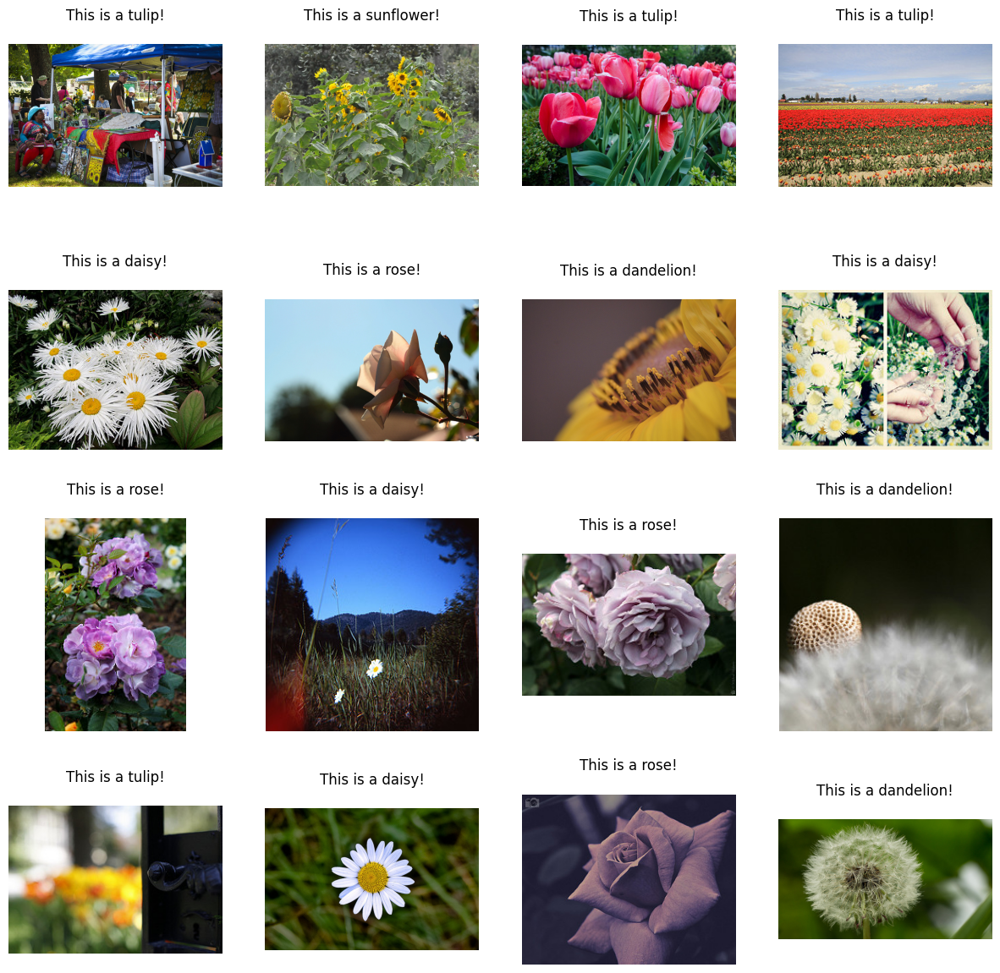

In [34]:
# Explore the data 
from dataset import FlowerDataset
from dataset import get_test_loader

fig = plt.figure(figsize=(15,15))
num_images = 16
testset = FlowerDataset(test_images, None)
testloader = get_test_loader(testset, batch_size=1)
testloader = iter(testloader)

model.eval()
with torch.no_grad():
  for i in range(num_images):
    image, label = next(testloader)
    # Apply transformation on image
    image_transf = transforms_test_val(image)
    out = model(image_transf)
    prediction = out.argmax(1)
    plt.subplot(num_images//4,4,i+1)
    plt.axis('off')
    plt.imshow(image.squeeze().moveaxis(0,-1))
    if(prediction.item()==0):
      plt.title("This is a daisy!\n")
    elif (prediction.item()==1):
      plt.title("This is a dandelion!\n")
    elif (prediction.item()==2):
      plt.title("This is a rose!\n")
    elif (prediction.item()==3):
      plt.title("This is a sunflower!\n")
    elif(prediction.item()==4):
      plt.title("This is a tulip!\n")

plt.show()

# Last step, unfreeze all the network and train it again with very little learning rate and weight decay

In [36]:
from torch.optim import SGD
from torch.nn import CrossEntropyLoss
from tqdm import tqdm
from dataset import get_train_val_loaders, FlowerDataset
from torchvision.models import resnet50

if __name__ == "__main__":

  trainset = FlowerDataset(train_images, transforms_train)
  valset = FlowerDataset(val_images, transforms_test_val)

  trainloader, valloader = get_train_val_loaders(trainset, valset, batch_size=8)

  # Use cuda if available
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

 # Load the weights of the network of the step before
  model = resnet50()
  model.fc = nn.Linear(2048,5)
  model.load_state_dict(torch.load("weights/weights_resnet_50_linear_probing.pth"))
    
  model.to(device)

  print("Tot model parameters:", sum([param.numel() for param in model.parameters()]))
  print("Trainable parameters:", sum([param.numel() for param in model.parameters() if param.requires_grad]))

  # Hyperparameters 
  learning_rate = 1e-5
  epochs = 5

  # Get the optimizer
  optimizer = SGD(model.parameters(),lr=learning_rate, weight_decay=1e-7, momentum=0.9)

  # Get the loss function 
  loss_fn = CrossEntropyLoss(reduction="mean")

  # Start the training loop
  for epoch in range(epochs):
    loss_training = 0
    accuracy_training = 0 
    print("Epoch:", epoch)
    for i, data in enumerate(tqdm(trainloader)):
      imgs, labels = data
      # Send data to GPU
      imgs = imgs.to(device)
      labels = labels.to(device)
      predictions = model(imgs)
      loss = loss_fn(predictions,labels.view(-1))
      
      # Calculate the training accuracy 
      accuracy_training += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()

      # Zero the gradients in the optimizer
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_training += loss.item()
    
    # Test on validation images 
    loss_validation = 0
    accuracy_validation = 0
    with torch.no_grad():
      model.eval()
      for i, data in enumerate(tqdm(valloader)):
        imgs, labels = data
        # Send data to GPU
        imgs = imgs.to(device)
        labels = labels.to(device)
        
        predictions = model(imgs)
        loss = loss_fn(predictions,labels.view(-1))
        loss_validation += loss.item()
        accuracy_validation += (sum(predictions.argmax(1)==labels)/imgs.shape[0]).item()
        
      # Put again model in training mode
      model.train()

    print("\nTraining loss epoch ",epoch,":",loss_training/len(trainloader))
    print("Training accuracy epoch ",epoch,":",accuracy_training/len(trainloader))
    print("Validation loss epoch ",epoch,":",loss_validation/len(valloader))
    print("Validation accuracy epoch ",epoch,":",accuracy_validation/len(valloader))

Tot model parameters: 23518277
Trainable parameters: 23518277
Epoch: 0


100%|██████████| 43/43 [00:08<00:00,  5.28it/s]



Training loss epoch  0 : 0.3436120999522105
Training accuracy epoch  0 : 0.8991002570694088
Validation loss epoch  0 : 0.3157719615413699
Validation accuracy epoch  0 : 0.8949335564014523
Epoch: 1


100%|██████████| 43/43 [00:07<00:00,  5.65it/s]



Training loss epoch  1 : 0.35468778875117746
Training accuracy epoch  1 : 0.8874678663851976
Validation loss epoch  1 : 0.3018106445670128
Validation accuracy epoch  1 : 0.9065614633781965
Epoch: 2


100%|██████████| 43/43 [00:08<00:00,  5.04it/s]



Training loss epoch  2 : 0.3364943527595013
Training accuracy epoch  2 : 0.8992287918044239
Validation loss epoch  2 : 0.303483295535972
Validation accuracy epoch  2 : 0.9094684401223826
Epoch: 3


100%|██████████| 43/43 [00:08<00:00,  5.05it/s]



Training loss epoch  3 : 0.3244034238255422
Training accuracy epoch  3 : 0.9042416452442159
Validation loss epoch  3 : 0.30883219799156797
Validation accuracy epoch  3 : 0.9036544866340105
Epoch: 4


100%|██████████| 43/43 [00:08<00:00,  5.04it/s]


Training loss epoch  4 : 0.3265209155478024
Training accuracy epoch  4 : 0.8993573265394392
Validation loss epoch  4 : 0.29511994366035904
Validation accuracy epoch  4 : 0.9094684401223826


In [37]:
# Save the weights of the network
torch.save(model.state_dict(), "weights/weights_resnet_50_finetuning.pth")

In [38]:
# Load the weights of the network 
model = resnet50()
model.fc = nn.Linear(2048,5)
model.load_state_dict(torch.load("weights/weights_resnet_50_finetuning.pth"))

<All keys matched successfully>

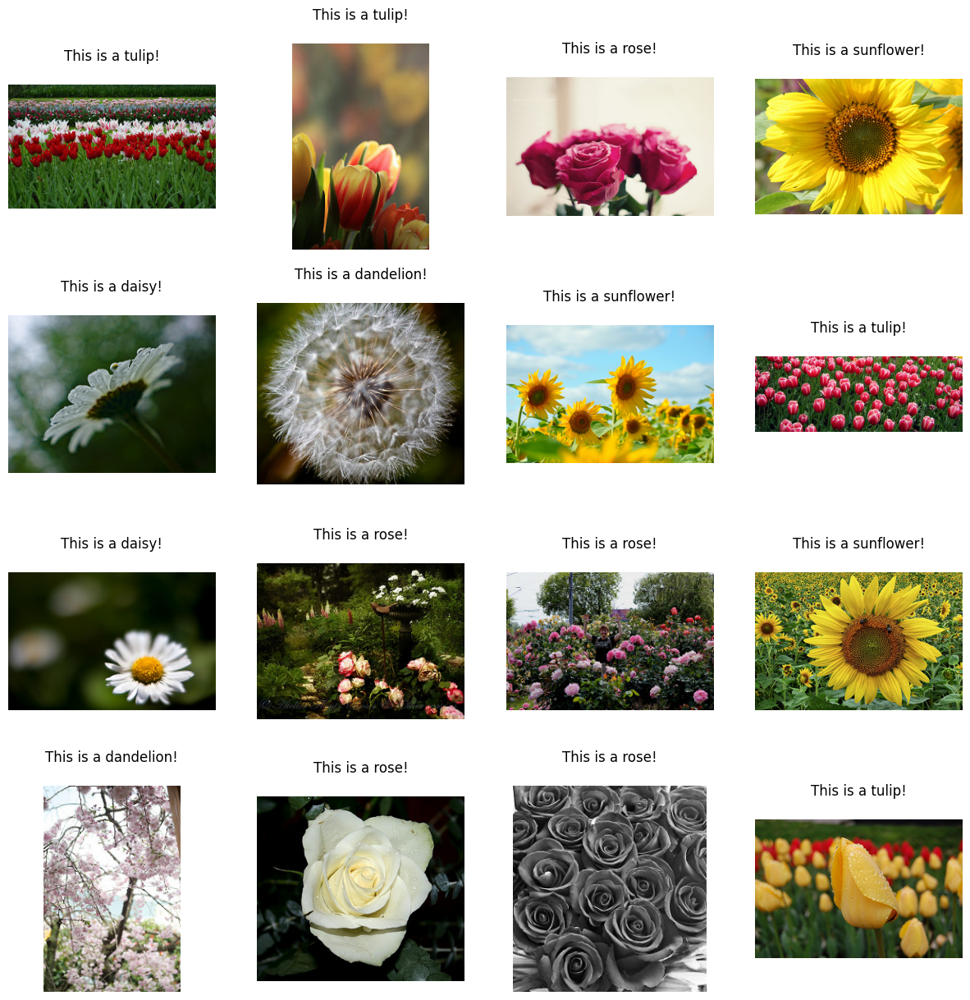

In [39]:
# Explore the data 
from dataset import FlowerDataset
from dataset import get_test_loader

fig = plt.figure(figsize=(15,15))
num_images = 16
testset = FlowerDataset(test_images, None)
testloader = get_test_loader(testset, batch_size=1)
testloader = iter(testloader)

model.eval()
with torch.no_grad():
  for i in range(num_images):
    image, label = next(testloader)
    # Apply transformation on image
    image_transf = transforms_test_val(image)
    out = model(image_transf)
    prediction = out.argmax(1)
    plt.subplot(num_images//4,4,i+1)
    plt.axis('off')
    plt.imshow(image.squeeze().moveaxis(0,-1))
    if(prediction.item()==0):
      plt.title("This is a daisy!\n")
    elif (prediction.item()==1):
      plt.title("This is a dandelion!\n")
    elif (prediction.item()==2):
      plt.title("This is a rose!\n")
    elif (prediction.item()==3):
      plt.title("This is a sunflower!\n")
    elif(prediction.item()==4):
      plt.title("This is a tulip!\n")

plt.show()